In [1]:
import scvelo as scv
import scanpy as sc
import pickle
import numpy as np
import pandas as pd

In [4]:
adata = scv.read("../data/merged_combine.loom", cache=True)

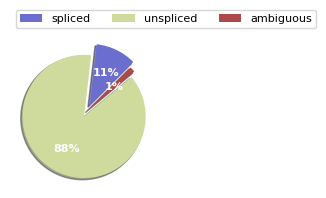

In [7]:
scv.pl.proportions(adata)

In [8]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata)
scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
scv.pp.log1p(adata)

Filtered out 32267 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


/var/folders/0l/5dgm9v295cz3jngvfm2pmflh0000gn/T/ipykernel_1897/2386943043.py:4: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  scv.pp.log1p(adata)


In [9]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


Filtered out 375 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
Logarithmized X.


/Users/mscavino/miniconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


computing neighbors
    finished (0:00:40) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:11) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [12]:
scv.pp.neighbors(adata)

computing neighbors
    finished (0:00:18) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [10]:
scv.tl.velocity(adata)

computing velocities


/Users/mscavino/miniconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:16) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [13]:
scv.tl.velocity_graph(adata)

or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.


ValueError: Your neighbor graph seems to be corrupted. Consider recomputing via pp.neighbors.

In [6]:
adata

AnnData object with n_obs × n_vars = 108010 × 36601
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [6]:
with open("../data/adata_epi_last.pickle", "rb") as f:
    adata_epi = pickle.load(f)

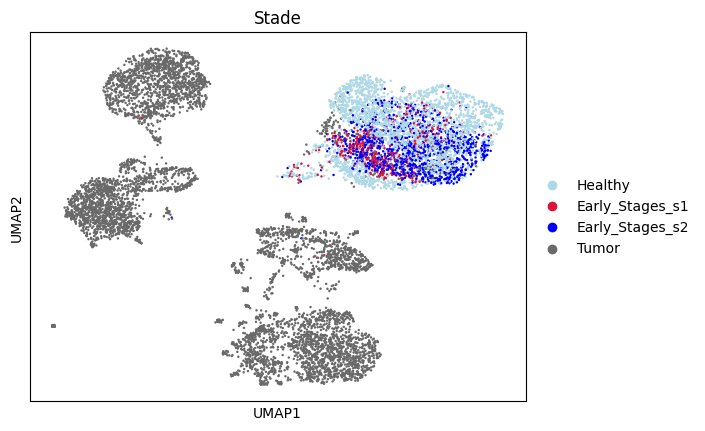

In [7]:
sc.pl.umap(adata_epi, color = "Stade")

In [107]:
ldata = sc.read_loom("../data/merged_combine.loom")

In [109]:
ldata

AnnData object with n_obs × n_vars = 108010 × 36601
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [111]:
ldata.obs

""
CellID
CD45neg1_possorted_genome_bam_R1JZ1:AAACCCAGTAGCGTTT
CD45neg1_possorted_genome_bam_R1JZ1:AAACCCACATTGAGGG
CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAAGAGAACCC
CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAAGGTTTGAA
CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAGTACCGTGC
...
Vp9_985bf1_sample_alignments_MS1CE:TTTGGTTAGCGCCTAC
Vp9_985bf1_sample_alignments_MS1CE:TTTGTTGGTCATCAGT
Vp9_985bf1_sample_alignments_MS1CE:TTTGTTGGTACGACTT


In [8]:
ldata.obs_names_make_unique()
adata_epi.obs_names_make_unique()

In [9]:
adata_epi.obs_names



Index(['AAACGCTCAACCACAT-1_1', 'AAAGTGAGTGAATAAC-1_1', 'AACAAAGCATAGATGA-1_1',
       'AACCAACGTGGGAGAG-1_1', 'AACTTCTTCCAGCAAT-1_1', 'AAGCCATCATATAGCC-1_1',
       'AAGCCATGTTGTTGCA-1_1', 'AAGGAATAGCAAGGAA-1_1', 'AAGTTCGAGAGAGCCT-1_1',
       'AATAGAGAGTGAGGTC-1_1',
       ...
       '45p_GM4D_GGAGGATTCATGCGGC-1', '45p_GM4D_GGCAGTCAGATCGCCC-1',
       '45p_GM4D_GGCTGTGAGAAGAGCA-1', '45p_GM4D_GGGAAGTAGGAACGCT-1',
       '45p_GM4D_GGTCTGGGTCCAGAAG-1', '45p_GM4D_GTAGATCAGCTGAAAT-1',
       '45p_GM4D_TAGGTACAGCAGGCTA-1', '45p_GM4D_TCTACATGTCTATGAC-1',
       '45p_GM4D_TTACAGGGTGCTATTG-1', '45n_4D_TGTTGAGGTACTGTTG-1'],
      dtype='object', length=9743)

In [10]:
ldata.obs_names

Index(['CD45neg1_possorted_genome_bam_R1JZ1:AAACCCAGTAGCGTTT',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACCCACATTGAGGG',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAAGAGAACCC',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAAGGTTTGAA',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAGTACCGTGC',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAGTAGATGTA',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAGTTCCACAA',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGCTGTTGGGCCT',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGCTGTTCCGCTT',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAAGAACGTCCACTCT',
       ...
       'Vp9_985bf1_sample_alignments_MS1CE:TTTATGCAGGACAGCT',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTGACTGTCCCGCAA',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTGTTGAGCAAGCCA',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTATGCGTATGGTTC',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTCAGTAGACGTCGA',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTGGT

In [11]:
index_adata_2 = [i.split("-")[0] for i in adata_epi.obs["New_Cell_ID"].values]

index_adata_2

['AAACGCTCAACCACAT',
 'AAAGTGAGTGAATAAC',
 'AACAAAGCATAGATGA',
 'AACCAACGTGGGAGAG',
 'AACTTCTTCCAGCAAT',
 'AAGCCATCATATAGCC',
 'AAGCCATGTTGTTGCA',
 'AAGGAATAGCAAGGAA',
 'AAGTTCGAGAGAGCCT',
 'AATAGAGAGTGAGGTC',
 'AATCACGCATTATGCG',
 'ACAAAGATCAGAGTGG',
 'ACAGAAATCTGAGTCA',
 'ACATTTCGTGTTCCTC',
 'ACCAACACACCTGCAG',
 'ACCCTCACAAAGGAGA',
 'ACTCTCGTCTGAGTCA',
 'AGAACAAGTGGATCAG',
 'AGACAGGTCCGCACGA',
 'AGAGAATGTTCAATCG',
 'AGCATCATCGGTATGT',
 'AGGGCCTCAATTGGTC',
 'AGGGCCTCATCGCTGG',
 'AGGGTCCGTATGTCCA',
 'AGGGTGAGTAAGACCG',
 'AGGGTTTGTGTCACAT',
 'AGGTAGGGTAGCTTGT',
 'AGTCACACAAGGCAAC',
 'AGTCATGCAAGCGAAC',
 'AGTGACTTCAGGAAGC',
 'AGTTCGATCAGAGCAG',
 'ATCACGACACGACGCT',
 'ATCACTTCAGGTCCGT',
 'ATCCACCGTCCAGCGT',
 'ATCGTCCGTTGGCCTG',
 'ATGCATGCAAGTTCCA',
 'ATGCATGCAGTCGCAC',
 'ATGCCTCAGCAGAAAG',
 'ATGCCTCGTGGCTTAT',
 'ATGGTTGAGCTTTCCC',
 'ATGGTTGCAAACTCTG',
 'ATGGTTGTCTAACGCA',
 'ATTACCTCAATACAGA',
 'ATTACTCTCCTCAGGG',
 'ATTACTCTCCTGTTGC',
 'ATTATCCCAGAAGCGT',
 'ATTATCCGTCTTGAAC',
 'ATTATCCTCGC

In [12]:
index_loom = ldata.obs_names
index_adata = adata_epi.obs_names

index_adata_2 = [i.split("-")[0] for i in adata_epi.obs["New_Cell_ID"].values]

dico = {a : [] for a in index_adata_2}

for i in index_adata_2:
    for j in index_loom:
        if i in j:
                dico[i].append(j)


In [13]:
liste = [i for i in dico.keys() if len(dico[i]) > 0]

In [14]:
len(liste)

1933

In [15]:
test = "CD45neg1_possorted_genome_bam_083L8:AAACCCAGTAGCGTTT".split(":")[1]
test

'AAACCCAGTAGCGTTT'

In [16]:
# Tenter de faire l'inverse et d'itérer sur les obs names de ldata
index_loom = ldata.obs_names
index_adata = adata_epi.obs_names

index_adata_2 = [i.split("-")[0] for i in adata_epi.obs["New_Cell_ID"].values]

index_loom_2 = [i.split(":")[1] for i in ldata.obs_names]
dicor = {a : [] for a in index_loom_2}
for i in index_loom_2:
    for j in index_adata_2:
        if i in j or j in i:
                dicor[i].append(j)


In [17]:
dicor

{'AAACCCAGTAGCGTTT': [],
 'AAACCCACATTGAGGG': [],
 'AAACGAAAGAGAACCC': [],
 'AAACGAAAGGTTTGAA': [],
 'AAACGAAGTACCGTGC': [],
 'AAACGAAGTAGATGTA': [],
 'AAACGAAGTTCCACAA': [],
 'AAACGCTGTTGGGCCT': [],
 'AAACGCTGTTCCGCTT': [],
 'AAAGAACGTCCACTCT': [],
 'AAAGAACGTTTACCTT': [],
 'AAAGAACTCCCGGTAG': [],
 'AAAGGATCACCCTAAA': [],
 'AAAGGATGTACGACAG': [],
 'AAAGGATGTGCTGTCG': [],
 'AAAGGATGTTAGAAAC': [],
 'AAAGGATTCGAGAAGC': [],
 'AAAGGATTCAGCCTCT': [],
 'AAAGGGCGTATGCTTG': [],
 'AAAGGGCGTCCGTTTC': ['CD45neg_AAAGGGCGTCCGTTTC'],
 'AAAGGGCTCATTACGG': [],
 'AAAGGGCTCTAAACGC': [],
 'AAAGTCCAGTCATGCT': [],
 'AAAGTCCTCGTACACA': ['CD45neg_AAAGTCCTCGTACACA'],
 'AAAGTGAAGACTACGG': ['CD45neg_AAAGTGAAGACTACGG'],
 'AAATGGAGTGTAAATG': [],
 'AAATGGATCGAACGGA': [],
 'AACAAAGCAACGGTAG': [],
 'AACAAAGAGTCTAGAA': [],
 'AACAAAGTCCCGTTGT': [],
 'AACAAAGTCCTCTCGA': [],
 'AACAAAGTCGAGGCAA': [],
 'AACAACCCACGAAGAC': [],
 'AACAACCGTAACTTCG': [],
 'AACACACAGATTCGAA': [],
 'AACACACAGAGGTCAC': ['CD45neg_AACACACAGAGGTCAC

In [18]:
liste = [i for i in dicor.keys() if len(dicor[i]) == 3]
len(liste)

3

In [19]:
dicor[liste[0]]

['CD45pos_GCTTTCGTCTTCGTAT',
 'CD45pos_GCTTTCGTCTTCGTAT',
 'CD45pos_GCTTTCGTCTTCGTAT']

In [20]:
adata_epi.obs["sample_batch"]

KeyError: 'sample_batch'

In [ ]:
ldata.obs.index

Index(['CD45neg1_possorted_genome_bam_R1JZ1:AAACCCAGTAGCGTTT',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACCCACATTGAGGG',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAAGAGAACCC',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAAGGTTTGAA',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAGTACCGTGC',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAGTAGATGTA',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGAAGTTCCACAA',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGCTGTTGGGCCT',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAACGCTGTTCCGCTT',
       'CD45neg1_possorted_genome_bam_R1JZ1:AAAGAACGTCCACTCT',
       ...
       'Vp9_985bf1_sample_alignments_MS1CE:TTTATGCAGGACAGCT',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTGACTGTCCCGCAA',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTGTTGAGCAAGCCA',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTATGCGTATGGTTC',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTCAGTAGACGTCGA',
       'Vp9_985bf1_sample_alignments_MS1CE:TTTGGT

In [21]:
adata_epi.obs.New_Cell_ID

AAACGCTCAACCACAT-1_1                AAACGCTCAACCACAT-1_AV44_CD45_10X
AAAGTGAGTGAATAAC-1_1                AAAGTGAGTGAATAAC-1_AV44_CD45_10X
AACAAAGCATAGATGA-1_1                AACAAAGCATAGATGA-1_AV44_CD45_10X
AACCAACGTGGGAGAG-1_1                AACCAACGTGGGAGAG-1_AV44_CD45_10X
AACTTCTTCCAGCAAT-1_1                AACTTCTTCCAGCAAT-1_AV44_CD45_10X
                                               ...                  
45p_GM4D_GTAGATCAGCTGAAAT-1    45p_GM4D_GTAGATCAGCTGAAAT-1_AV63_GM4D
45p_GM4D_TAGGTACAGCAGGCTA-1    45p_GM4D_TAGGTACAGCAGGCTA-1_AV63_GM4D
45p_GM4D_TCTACATGTCTATGAC-1    45p_GM4D_TCTACATGTCTATGAC-1_AV63_GM4D
45p_GM4D_TTACAGGGTGCTATTG-1    45p_GM4D_TTACAGGGTGCTATTG-1_AV63_GM4D
45n_4D_TGTTGAGGTACTGTTG-1        45n_4D_TGTTGAGGTACTGTTG-1_AV63_GM4D
Name: New_Cell_ID, Length: 9743, dtype: object

In [22]:
ldata.obs.index = index_loom_2

In [23]:
ldata.obs_names_make_unique()

In [24]:
ldata.obs

""
AAACCCAGTAGCGTTT
AAACCCACATTGAGGG
AAACGAAAGAGAACCC
AAACGAAAGGTTTGAA
AAACGAAGTACCGTGC
...
TTTGGTTAGCGCCTAC
TTTGTTGGTCATCAGT
TTTGTTGGTACGACTT
TTTGTTGCAGAATGTA


In [25]:
liste = []
liste_bad = []
for i in adata_epi.obs.New_Cell_ID.values:
    trunc = i.split("-")[0]
    if len(trunc.split("_")) > 0:
        trunc = trunc.split("_")[len(trunc.split("_"))-1]
    if trunc in ldata.obs.index:
        liste.append(trunc)
    else:
        liste_bad.append((i,trunc))

In [26]:
ldata.obs.index

Index(['AAACCCAGTAGCGTTT', 'AAACCCACATTGAGGG', 'AAACGAAAGAGAACCC',
       'AAACGAAAGGTTTGAA', 'AAACGAAGTACCGTGC', 'AAACGAAGTAGATGTA',
       'AAACGAAGTTCCACAA', 'AAACGCTGTTGGGCCT', 'AAACGCTGTTCCGCTT',
       'AAAGAACGTCCACTCT',
       ...
       'TTTATGCAGGACAGCT', 'TTTGACTGTCCCGCAA', 'TTTGTTGAGCAAGCCA',
       'TTTATGCGTATGGTTC', 'TTTCAGTAGACGTCGA', 'TTTGGTTAGCGCCTAC',
       'TTTGTTGGTCATCAGT', 'TTTGTTGGTACGACTT', 'TTTGTTGCAGAATGTA',
       'TTTGTTGCAACAGCCC'],
      dtype='object', length=108010)

In [27]:
len(liste)

4482

In [28]:
len(liste_bad)

5261

In [29]:
"AACAAAGCATAGATGA" in ldata.obs.index

False

In [30]:
liste_bad[0]

('AAACGCTCAACCACAT-1_AV44_CD45_10X', 'AAACGCTCAACCACAT')

In [31]:
liste_bad2 = [i[0] for i in liste_bad]

In [32]:
df = adata_epi[adata_epi.obs["New_Cell_ID"].isin(liste_bad2)].obs

np.unique(df["orig.ident"])

array(['AV44', 'AV48', 'AV58', 'AV66_GM4G', 'AV75', 'AV76'], dtype=object)

In [33]:
for i in index_adata_2:
    for j in index_loom:
        if i in j:
                print((i,j))

('ACAAAGATCAGAGTGG', 'CD45pos2_possorted_genome_bam_1JFF3:ACAAAGATCAGAGTGG')
('TCAATTCAGGGCGAAG', 'Vp10_litermate_976af12_sample_alignments_6NDO6:TCAATTCAGGGCGAAG')
('TTCCACGAGACCAGCA', 'Vn7_Gm2d_sample_alignments_OARUP:TTCCACGAGACCAGCA')
('AAACCCAAGTCACTAC', 'CD45pos2_possorted_genome_bam_1JFF3:AAACCCAAGTCACTAC')
('AATAGAGGTCTACGAT', 'VN5_Gm2g_sample_alignments_HJBBM:AATAGAGGTCTACGAT')
('AATCACGTCTGTACAG', 'Vn8_Gm4d_sample_alignments_Q1XN3:AATCACGTCTGTACAG')
('AATCGTGAGCGCTGCT', 'Vn6_possorted_genome_bam_Z9P2K:AATCGTGAGCGCTGCT')
('ACAACCAGTACAAAGT', 'Vn9_986af2_sample_alignments_S3976:ACAACCAGTACAAAGT')
('ACCAAACCAATAGTAG', 'Vp9_985bf1_sample_alignments_MS1CE:ACCAAACCAATAGTAG')
('ACCTGTCCACGGTGCT', 'VN3_Gm4d_sample_alignments_AKCA6:ACCTGTCCACGGTGCT')
('AGAGCCCCAACGATCT', 'Vp12_Gm4g_sample_alignments_B9F5T:AGAGCCCCAACGATCT')
('AGCGTCGAGAATAGTC', 'Vn9_985bf1_sample_alignments_67TZI:AGCGTCGAGAATAGTC')
('ATACCTTAGACTTCAC', 'Vp10_litermate_950af2_sample_alignments_6T5I6:ATACCTTAGACTTCAC')


KeyboardInterrupt: 

In [34]:
in_loom_not_adata = []
for i in index_loom:
    if i not in index_adata:
        in_loom_not_adata.append(i)

In [35]:
for i in index_adata:
    for j in in_loom_not_adata:
        if j in i:
            print(i)

In [36]:
adata_velo = scv.utils.merge(adata_epi, ldata)

,initial_size_unspliced,initial_size_spliced,initial_size,sample_batch
AAAGGATGTACG,6764,6,6.0,CD45neg1_possorted_genome_bam_083L8:ACAGx
AACACACGTCGC,358,34,34.0,CD45neg1_possorted_genome_bam_083L8:ATCGx
AATGCCAGTGGT,87,1,1.0,CD45neg1_possorted_genome_bam_083L8:TTACx
AATGAAGCATTA,2240,89,89.0,CD45neg1_possorted_genome_bam_083L8:CTCTx
AAGCGTTTCCCT,1094,54,54.0,CD45neg1_possorted_genome_bam_083L8:CATGx
...,...,...,...,...
TTAGTCTCATCG,2499,71,71.0,Vp9_985bf1_sample_alignments_INW82:TCTCx
TTGTTGCAACAG,1798,43,43.0,Vp9_985bf1_sample_alignments_INW82:TCCCx
TTGTTGCAGAAT,2519,766,766.0,Vp9_985bf1_sample_alignments_INW82:TGTAx
TTGTTGGTCATC,1826,741,741.0,Vp9_985bf1_sample_alignments_INW82:TAGTx


KeyError: 'Stade'

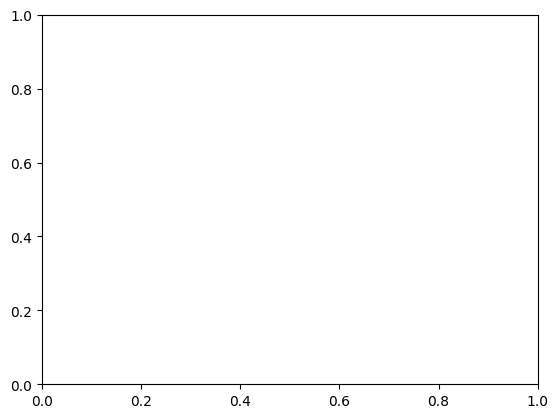

In [112]:
sc.pl.umap(adata_velo, color = "Stade")

In [38]:
adata_velo

AnnData object with n_obs × n_vars = 3755 × 3
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'Stage_old', 'new_orig', 'has_cnv', 'cnv_group', 'Stade', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'orig.ident_colors', 'Population_colors', 'draw_graph', 'diffmap_evals', 'Experiment_ID_colors', 'Stage_old_colors', 'new_orig_colors', 'cnv_group_colors', 'Stade_colors'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa', 'X_diffmap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [41]:
scv.pp.filter_and_normalize(adata_epi, enforce = True)
scv.pp.moments(adata_epi)

Normalized count data: X.


/Users/mscavino/miniconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


Logarithmized X.
computing neighbors
    finished (0:00:18) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [42]:
scv.tl.velocity(adata_epi, mode = "stochastic")

computing velocities


KeyError: 'Ms'

In [43]:
scv.tl.velocity_graph(adata_epi)

computing velocities


KeyError: 'Ms'

In [39]:
with open("../data/adata_new_orig.pickle", "rb") as f:
    adata = pickle.load(f)

In [40]:
adata

AnnData object with n_obs × n_vars = 119630 × 2922
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [43]:
liste = []
liste_bad = []
liste_trunc = []
for i in adata.obs.New_Cell_ID.values:
    trunc = i.split("-")[0]
    if len(trunc.split("_")) > 0:
        trunc = trunc.split("_")[len(trunc.split("_"))-1]
    liste_trunc.append(trunc)

    if trunc in ldata.obs.index:
        liste.append(trunc)
    else:
        liste_bad.append((i,trunc))

In [44]:
len(liste)

0

In [45]:
len(liste_bad)

119630

In [171]:

adata.obs.index = liste_trunc

In [174]:
len(liste_trunc)
len(np.unique(liste_trunc))

117786

In [172]:
adata_velo = scv.utils.merge(adata, ldata)

InvalidIndexError: Reindexing only valid with uniquely valued Index objects

In [47]:
ldata.obs

,initial_size_unspliced,initial_size_spliced,initial_size,sample_batch
AAAGGATGTACG,6764,6,6.0,CD45neg1_possorted_genome_bam_083L8:ACAGx
AACACACGTCGC,358,34,34.0,CD45neg1_possorted_genome_bam_083L8:ATCGx
AATGCCAGTGGT,87,1,1.0,CD45neg1_possorted_genome_bam_083L8:TTACx
AATGAAGCATTA,2240,89,89.0,CD45neg1_possorted_genome_bam_083L8:CTCTx
AAGCGTTTCCCT,1094,54,54.0,CD45neg1_possorted_genome_bam_083L8:CATGx
...,...,...,...,...
TTAGTCTCATCG,2499,71,71.0,Vp9_985bf1_sample_alignments_INW82:TCTCx
TTGTTGCAACAG,1798,43,43.0,Vp9_985bf1_sample_alignments_INW82:TCCCx
TTGTTGCAGAAT,2519,766,766.0,Vp9_985bf1_sample_alignments_INW82:TGTAx
TTGTTGGTCATC,1826,741,741.0,Vp9_985bf1_sample_alignments_INW82:TAGTx


In [48]:
adata_velo

AnnData object with n_obs × n_vars = 3051 × 7
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [49]:
adata.obs_names

Index(['AAACCCAAGAGG', 'AAACCCAAGCGC', 'AAACCCAAGGTG', 'AAACCCACATCT',
       'AAACCCACATGT', 'AAACCCAGTCCG', 'AAACCCAGTCTT', 'AAACCCATCGAC',
       'AAACCCATCGAG', 'AAACGAAAGGCT',
       ...
       '45n_4D_TTTCA-11', '45n_4D_TTTCC-3', '45n_4D_TTTCC-4', '45n_4D_TTTCC-5',
       '45n_4D_TTTCG-3', '45n_4D_TTTGA-7', '45n_4D_TTTGA-8', '45n_4D_TTTGA-9',
       '45n_4D_TTTGA-10', '45n_4D_TTTGT-4'],
      dtype='object', length=119630)

In [51]:
pd.unique(adata.obs_names.intersection(ldata.obs_names))

array(['AAACCCATCGAC', 'AAACGAACAGAG', 'AAAGAACGTCCA', ...,
       'TTTCCTCCATCC', 'TTTGGTTGTACA', 'TTTGTTGGTTAC'], dtype=object)

In [41]:
a = adata.obs_names
b = pd.unique(adata.obs_names.intersection(ldata.obs_names))
print(len(set(a).intersection(set(b))))

2816


In [42]:
print(len(b))

2816


In [45]:
print(len(ldata.obs_names))

26634


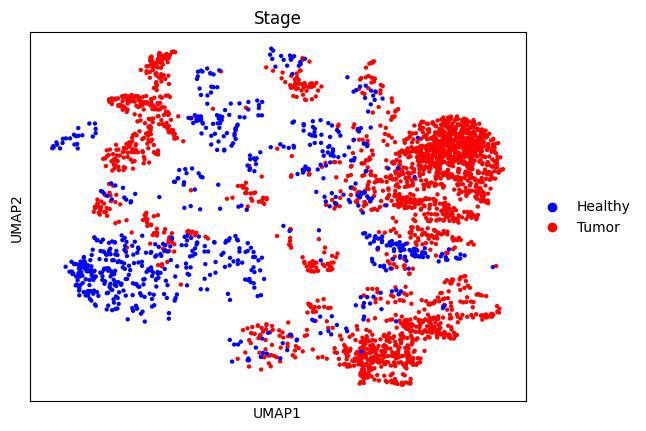

In [50]:
sc.pl.umap(adata_velo, color = "Stage")

In [51]:
scv.pp.moments(adata)

computing neighbors
    finished (0:00:35) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [52]:
scv.tl.velocity(adata, mode='stochastic')

computing velocities


KeyError: 'Ms'

In [48]:
with open("../data/adata_new_orig.pickle", "rb") as f:
    adata = pickle.load(f)

In [49]:
adata.obs_names

Index(['AAACCCAAGAGGGTCT-1_1', 'AAACCCAAGCGCCTAC-1_1', 'AAACCCAAGGTGCTAG-1_1',
       'AAACCCACATCTGCGG-1_1', 'AAACCCACATGTGCTA-1_1', 'AAACCCAGTCCGGTGT-1_1',
       'AAACCCAGTCTTGCGG-1_1', 'AAACCCATCGACGACC-1_1', 'AAACCCATCGAGTACT-1_1',
       'AAACGAAAGGCTTTCA-1_1',
       ...
       '45n_4D_TTTCATGCATCTTAGG-1', '45n_4D_TTTCCTCAGCTGACAG-1',
       '45n_4D_TTTCCTCTCCGTGTGG-1', '45n_4D_TTTCCTCTCTGTCGCT-1',
       '45n_4D_TTTCGATGTTCGAAGG-1', '45n_4D_TTTGACTCACATGTTG-1',
       '45n_4D_TTTGACTGTAGGAGTC-1', '45n_4D_TTTGACTTCACGTAGT-1',
       '45n_4D_TTTGATCTCGCGTGAC-1', '45n_4D_TTTGTTGAGAGTGGCT-1'],
      dtype='object', length=119630)

In [50]:
adata_epi.obs_names

Index(['AAACGCTCAACC', 'AAAGTGAGTGAA', 'AACAAAGCATAG', 'AACCAACGTGGG',
       'AACTTCTTCCAG', 'AAGCCATCATAT', 'AAGCCATGTTGT', 'AAGGAATAGCAA',
       'AAGTTCGAGAGA', 'AATAGAGAGTGA',
       ...
       '45p_GM4D_GGA', '45p_GM4D_GGC-1', '45p_GM4D_GGC-2', '45p_GM4D_GGG',
       '45p_GM4D_GGT', '45p_GM4D_GTA', '45p_GM4D_TAG', '45p_GM4D_TCT',
       '45p_GM4D_TTA', '45n_4D_TGTTG-1'],
      dtype='object', length=9743)

In [51]:
index_all_adata = [i.split("-")[0] for i in adata.obs["New_Cell_ID"].values]



In [52]:
index_adata = []
for i in index_all_adata:
    test = i.split("_")
    if len(test) > 1:
        index_adata.append(test[len(test)-1])
    else:
        index_adata.append(i)


In [53]:
index_adata

['AAACCCAAGAGGGTCT',
 'AAACCCAAGCGCCTAC',
 'AAACCCAAGGTGCTAG',
 'AAACCCACATCTGCGG',
 'AAACCCACATGTGCTA',
 'AAACCCAGTCCGGTGT',
 'AAACCCAGTCTTGCGG',
 'AAACCCATCGACGACC',
 'AAACCCATCGAGTACT',
 'AAACGAAAGGCTTTCA',
 'AAACGAAAGTAGGGTC',
 'AAACGAACAGAGAATT',
 'AAACGAACATCGGAAG',
 'AAACGAACATGGGATG',
 'AAACGAAGTACGATTC',
 'AAACGAAGTAGGAAAG',
 'AAACGAAGTCCTGGTG',
 'AAACGAAGTCGTCAGC',
 'AAACGAAGTGGATGAC',
 'AAACGAAGTTGCCGAC',
 'AAACGAAGTTGGGAAC',
 'AAACGAATCAAGCCGC',
 'AAACGAATCATGCTAG',
 'AAACGCTAGAACGCGT',
 'AAACGCTCAAAGCTCT',
 'AAACGCTCAACCACAT',
 'AAACGCTCAACCACGC',
 'AAACGCTGTACGGATG',
 'AAACGCTGTATGCGGA',
 'AAACGCTTCCTTCACG',
 'AAACGCTTCGCGATCG',
 'AAAGAACAGACTAAGT',
 'AAAGAACCACTGTGTA',
 'AAAGAACCAGAACTAA',
 'AAAGAACCATCCTCAC',
 'AAAGAACGTCCAGTTA',
 'AAAGAACGTGCTGATT',
 'AAAGAACTCAGACCCG',
 'AAAGAACTCAGTCACA',
 'AAAGAACTCATTCGTT',
 'AAAGAACTCCAGTTCC',
 'AAAGAACTCCTGGTCT',
 'AAAGAACTCGAGTTGT',
 'AAAGGATAGCACGTCC',
 'AAAGGATAGCGCGTTC',
 'AAAGGATAGTCATCCA',
 'AAAGGATCAGGATGAC',
 'AAAGGATTCAG

In [54]:
index_loom_2 = [i.split(":")[1] for i in ldata.obs_names]
index_loom_2

['AAACCCAGTAGCGTTT',
 'AAACCCACATTGAGGG',
 'AAACGAAAGAGAACCC',
 'AAACGAAAGGTTTGAA',
 'AAACGAAGTACCGTGC',
 'AAACGAAGTAGATGTA',
 'AAACGAAGTTCCACAA',
 'AAACGCTGTTGGGCCT',
 'AAACGCTGTTCCGCTT',
 'AAAGAACGTCCACTCT',
 'AAAGAACGTTTACCTT',
 'AAAGAACTCCCGGTAG',
 'AAAGGATCACCCTAAA',
 'AAAGGATGTACGACAG',
 'AAAGGATGTGCTGTCG',
 'AAAGGATGTTAGAAAC',
 'AAAGGATTCGAGAAGC',
 'AAAGGATTCAGCCTCT',
 'AAAGGGCGTATGCTTG',
 'AAAGGGCGTCCGTTTC',
 'AAAGGGCTCATTACGG',
 'AAAGGGCTCTAAACGC',
 'AAAGTCCAGTCATGCT',
 'AAAGTCCTCGTACACA',
 'AAAGTGAAGACTACGG',
 'AAATGGAGTGTAAATG',
 'AAATGGATCGAACGGA',
 'AACAAAGCAACGGTAG',
 'AACAAAGAGTCTAGAA',
 'AACAAAGTCCCGTTGT',
 'AACAAAGTCCTCTCGA',
 'AACAAAGTCGAGGCAA',
 'AACAACCCACGAAGAC',
 'AACAACCGTAACTTCG',
 'AACACACAGATTCGAA',
 'AACACACAGAGGTCAC',
 'AACACACCACCCTGTT',
 'AACACACGTCGCATCG',
 'AACACACGTATGACAA',
 'AACACACTCTGCGGCA',
 'AACCAACAGATCGGTG',
 'AACCAACAGGAGAGTA',
 'AACCAACCAGCGCGTT',
 'AACCAACTCGCTCCTA',
 'AACCAACTCTATCGTT',
 'AACCACAGTGATGTAA',
 'AACCATGAGGGCCCTT',
 'AACCATGCAGT

In [60]:
good = []
bad = []
for i in index_loom_2:
    if i in index_adata:
        good.append(i)
    else:
        bad.append(i)

In [61]:
len(good)

80132

In [62]:
len(bad)

27878

In [63]:
good2 = []
bad2 = []
for i in index_adata:
    if i in index_loom_2:
        good2.append(i)
    else:
        bad2.append(i)

In [64]:
len(good2)

80393

In [65]:
len(bad2)

39237

In [81]:
for i in bad2:
    print(i)

AAACCCAAGAGGGTCT
AAACCCAAGCGCCTAC
AAACCCAAGGTGCTAG
AAACCCACATCTGCGG
AAACCCACATGTGCTA
AAACCCAGTCCGGTGT
AAACCCAGTCTTGCGG
AAACCCATCGACGACC
AAACCCATCGAGTACT
AAACGAAAGGCTTTCA
AAACGAAAGTAGGGTC
AAACGAACAGAGAATT
AAACGAACATCGGAAG
AAACGAACATGGGATG
AAACGAAGTACGATTC
AAACGAAGTAGGAAAG
AAACGAAGTCCTGGTG
AAACGAAGTCGTCAGC
AAACGAAGTGGATGAC
AAACGAAGTTGCCGAC
AAACGAAGTTGGGAAC
AAACGAATCAAGCCGC
AAACGAATCATGCTAG
AAACGCTAGAACGCGT
AAACGCTCAAAGCTCT
AAACGCTCAACCACAT
AAACGCTCAACCACGC
AAACGCTGTACGGATG
AAACGCTGTATGCGGA
AAACGCTTCCTTCACG
AAAGAACAGACTAAGT
AAAGAACCACTGTGTA
AAAGAACCAGAACTAA
AAAGAACCATCCTCAC
AAAGAACGTCCAGTTA
AAAGAACGTGCTGATT
AAAGAACTCAGACCCG
AAAGAACTCAGTCACA
AAAGAACTCATTCGTT
AAAGAACTCCAGTTCC
AAAGAACTCCTGGTCT
AAAGAACTCGAGTTGT
AAAGGATAGCACGTCC
AAAGGATAGCGCGTTC
AAAGGATAGTCATCCA
AAAGGATCAGGATGAC
AAAGGATTCAGCCTTC
AAAGGATTCTTAAGGC
AAAGGGCCAAGACCGA
AAAGGGCCAAGAGCTG
AAAGGGCCACCCAATA
AAAGGGCCAGCTACAT
AAAGGGCCATGACTGT
AAAGGGCGTCTTCATT
AAAGGGCTCAAACCCA
AAAGGGCTCTCCTACG
AAAGGTAAGAGAGCAA
AAAGGTAAGATGTTGA
AAAGGTACACAGCT

In [66]:
adata_obs = adata.obs

In [67]:
adata_obs.index = index_adata

adata_good = adata_obs[adata_obs.index.isin(good2)]

In [68]:
adata_bad = adata_obs[adata_obs.index.isin(bad2)]

In [69]:
np.unique(adata_good["orig.ident"])

array(['AV44', 'AV48', 'AV51', 'AV53', 'AV58', 'AV59', 'AV63_GM2D',
       'AV63_GM2G', 'AV63_GM4D', 'AV65', 'AV66_GM2D', 'AV66_GM2G',
       'AV66_GM4D', 'AV66_GM4G', 'AV67_GM2D', 'AV67_GM2G', 'AV67_GM4D',
       'AV67_GM4G', 'AV75', 'AV76', 'AV81_GM2D', 'AV81_GM2G', 'AV81_GM4D',
       'AV81_GM4G'], dtype=object)

In [70]:
np.unique(adata_bad["orig.ident"])

array(['AV44', 'AV48', 'AV53', 'AV58', 'AV63_GM2D', 'AV63_GM2G', 'AV65',
       'AV66_GM2D', 'AV66_GM2G', 'AV66_GM4G', 'AV75', 'AV76', 'AV81_GM2G'],
      dtype=object)

In [36]:
np.intersect1d(index_adata, index_loom_2)

array(['AAACCCAAGAAGCTCG', 'AAACCCAAGACATACA', 'AAACCCAAGATGTTCC', ...,
       'TTTGTTGTCTCGACGG', 'TTTGTTGTCTTCACAT', 'TTTGTTGTCTTCGGAA'],
      dtype='<U16')

In [41]:
[i for i in good2 if i not in bad2]

['AAACGCTTCGCGATCG',
 'AAAGTCCCAGACGCTC',
 'AACAACCGTTTGTTGG',
 'AACACACCAGCCATTA',
 'AAGACAACATGACAGG',
 'AAGCCATGTCACTTAG',
 'AAGGAATTCGTCGGGT',
 'AAGTGAACAAGAGATT',
 'AATGACCCAATGCAAA',
 'AATTCCTGTACCCGCA',
 'ACAAAGATCAGAGTGG',
 'ACATTTCTCCCTTGGT',
 'ACCTACCCAAATTGCC',
 'ACCTGTCGTGCGTGCT',
 'ACTATCTCAGGTGAGT',
 'ACTATTCAGACAAGCC',
 'ACTTTCAGTGCAATAA',
 'AGAACAATCCGAGTGC',
 'AGACTCAAGAAATCCA',
 'AGAGCCCCATTGAAAG',
 'AGCCAATTCGTTCATT',
 'AGCGTCGCAAGCCTGC',
 'AGGCATTTCTCCTACG',
 'AGGGTGATCTGAGCAT',
 'AGGTTGTAGTGTTGAA',
 'AGTGTTGCAGGGCTTC',
 'AGTTCCCAGGCTTAGG',
 'AGTTCCCAGGTACAGC',
 'AGTTCGACAGTTAGGG',
 'ATCACTTAGTACAGAT',
 'ATCCATTGTGTCCTAA',
 'ATCCTATAGCTCTGTA',
 'ATGGAGGGTGAGACCA',
 'ATGGGAGGTTTATGCG',
 'ATTCCCGGTTGGCCTG',
 'ATTGGGTCATCGAAGG',
 'ATTGTTCGTTCTTAGG',
 'ATTTACCGTCTGTGTA',
 'CAAAGAACACGACGCT',
 'CAAGACTCAATAGGAT',
 'CACACAAGTTGTCCCT',
 'CACACAATCTCTTCAA',
 'CACAGATCAGCTGAGA',
 'CACATGAAGGCATCTT',
 'CACATGACAAGCACAG',
 'CACCAAATCACTTCTA',
 'CACTGTCAGATGCGAC',
 'CATACAGAGGA

In [71]:
adata_obs

,orig.ident,nCount_RNA,nFeature_RNA,Experiment_ID,Stage,New_Cell_ID,Population,Mouse_ID,Week_post Cre_activation,Sub_class_Stage,Mammary_glands,mouse_age_(Week),new_orig
AAACCCAAGAGGGTCT,AV44,12201.0,2877,AV44,Tumor,AAACCCAAGAGGGTCT-1_AV44_CD45_10X,Langerhans_cells,863af3,33.0,Tumor,GM4G,44,AV44
AAACCCAAGCGCCTAC,AV44,12206.0,2536,AV44,Tumor,AAACCCAAGCGCCTAC-1_AV44_CD45_10X,Mo_Mac,863af3,33.0,Tumor,GM4G,44,AV44
AAACCCAAGGTGCTAG,AV44,15871.0,3330,AV44,Tumor,AAACCCAAGGTGCTAG-1_AV44_CD45_10X,Langerhans_cells,863af3,33.0,Tumor,GM4G,44,AV44
AAACCCACATCTGCGG,AV44,17208.0,3234,AV44,Tumor,AAACCCACATCTGCGG-1_AV44_CD45_10X,Mo_Mac,863af3,33.0,Tumor,GM4G,44,AV44
AAACCCACATGTGCTA,AV44,544.0,316,AV44,Tumor,AAACCCACATGTGCTA-1_AV44_CD45_10X,Endothelial_cells,863af3,33.0,Tumor,GM4G,44,AV44
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTCACATGTTG,AV63_GM4D,5043.0,1962,AV63,Early_Stages,45n_4D_TTTGACTCACATGTTG-1_AV63_GM4D,CD8,903af3,38.0,Adenosis,GM4D,51,AV63_GM4D
TTTGACTGTAGGAGTC,AV63_GM4D,2903.0,1351,AV63,Early_Stages,45n_4D_TTTGACTGTAGGAGTC-1_AV63_GM4D,CD4,903af3,38.0,Adenosis,GM4D,51,AV63_GM4D
TTTGACTTCACGTAGT,AV63_GM4D,66133.0,6979,AV63,Early_Stages,45n_4D_TTTGACTTCACGTAGT-1_AV63_GM4D,Prolif_cDC1,903af3,38.0,Adenosis,GM4D,51,AV63_GM4D
TTTGATCTCGCGTGAC,AV63_GM4D,15390.0,3907,AV63,Early_Stages,45n_4D_TTTGATCTCGCGTGAC-1_AV63_GM4D,pDC,903af3,38.0,Adenosis,GM4D,51,AV63_GM4D


In [72]:
adata.obs.index = index_adata
ldata.obs.index = index_loom_2


adata.obs_names_make_unique()
ldata.obs_names_make_unique()

In [73]:
adata_velo = scv.utils.merge(adata, ldata)

In [74]:
adata_velo

AnnData object with n_obs × n_vars = 79554 × 7
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'new_orig', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'log1p', 'hvg', 'pca', 'Stage_colors', 'neighbors', 'umap', 'new_orig_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

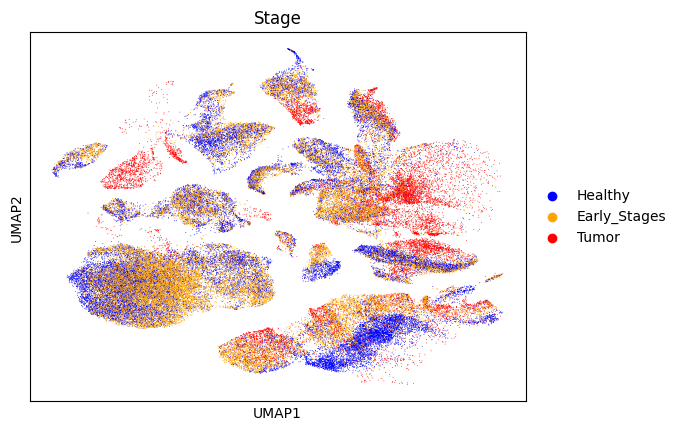

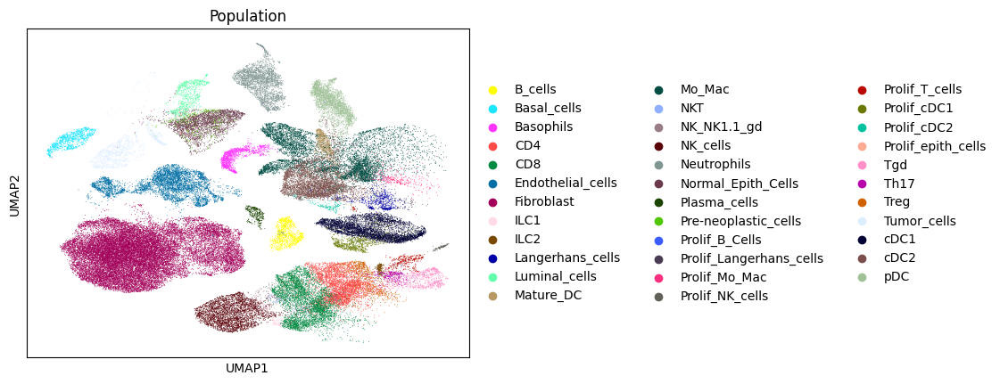

In [113]:
sc.pl.umap(adata_velo, color = "Stage")
sc.pl.umap(adata_velo, color = "Population")

In [76]:
scv.pp.moments(adata_velo)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:31) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [64]:
scv.tl.velocity(adata_velo, mode='deterministic')





computing velocities
The correlation threshold has been reduced to -0.0003.
Please be cautious when interpreting results.
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [79]:
scv.pp.neighbors(adata_velo)

computing neighbors
    finished (0:00:12) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [80]:
scv.tl.velocity_graph(adata_velo)

or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing velocities
The correlation threshold has been reduced to -0.0006.
Please be cautious when interpreting results.


LinAlgError: SVD did not converge

In [61]:
scv.pl.velocity_embedding(adata_velo, basis='umap')
scv.pl.velocity_embedding_grid(adata_velo, basis='umap')
scv.pl.velocity_embedding_stream(adata_velo, basis='umap')

computing velocity embedding


ValueError: You need to run `tl.velocity_graph` first to compute cosine correlations.

In [ ]:
# Check en ne partant pas du .pickle

In [87]:
ldata = sc.read_loom("../data/merged_no_barcodes.loom")

In [3]:
adata = sc.read_h5ad("../data/MERGED_SEU_REANOTATE_V3.h5ad")
adata

AnnData object with n_obs × n_vars = 120860 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)'
    var: 'features'

In [4]:
cells_to_remove = "AV63_GM4G"

adata = adata[adata.obs['orig.ident'] != cells_to_remove, :].copy()
adata.obs.loc[adata.obs["orig.ident"] == 'AV63_GM4D', "Stage"] = "Early_Stages"
adata.obs.loc[adata.obs["orig.ident"] == 'AV63_GM4D', "Stage"]

adata

AnnData object with n_obs × n_vars = 119630 × 25572
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)'
    var: 'features'

In [5]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,Experiment_ID,Stage,New_Cell_ID,Population,Mouse_ID,Week_post Cre_activation,Sub_class_Stage,Mammary_glands,mouse_age_(Week)
AAACCCAAGAGGGTCT-1_1,AV44,12201.0,2877,AV44,Tumor,AAACCCAAGAGGGTCT-1_AV44_CD45_10X,Langerhans_cells,863af3,33.0,Tumor,GM4G,44
AAACCCAAGCGCCTAC-1_1,AV44,12206.0,2536,AV44,Tumor,AAACCCAAGCGCCTAC-1_AV44_CD45_10X,Mo_Mac,863af3,33.0,Tumor,GM4G,44
AAACCCAAGGTGCTAG-1_1,AV44,15871.0,3330,AV44,Tumor,AAACCCAAGGTGCTAG-1_AV44_CD45_10X,Langerhans_cells,863af3,33.0,Tumor,GM4G,44
AAACCCACATCTGCGG-1_1,AV44,17208.0,3234,AV44,Tumor,AAACCCACATCTGCGG-1_AV44_CD45_10X,Mo_Mac,863af3,33.0,Tumor,GM4G,44
AAACCCACATGTGCTA-1_1,AV44,544.0,316,AV44,Tumor,AAACCCACATGTGCTA-1_AV44_CD45_10X,Endothelial_cells,863af3,33.0,Tumor,GM4G,44
...,...,...,...,...,...,...,...,...,...,...,...,...
45n_4D_TTTGACTCACATGTTG-1,AV63_GM4D,5043.0,1962,AV63,Early_Stages,45n_4D_TTTGACTCACATGTTG-1_AV63_GM4D,CD8,903af3,38.0,Adenosis,GM4D,51
45n_4D_TTTGACTGTAGGAGTC-1,AV63_GM4D,2903.0,1351,AV63,Early_Stages,45n_4D_TTTGACTGTAGGAGTC-1_AV63_GM4D,CD4,903af3,38.0,Adenosis,GM4D,51
45n_4D_TTTGACTTCACGTAGT-1,AV63_GM4D,66133.0,6979,AV63,Early_Stages,45n_4D_TTTGACTTCACGTAGT-1_AV63_GM4D,Prolif_cDC1,903af3,38.0,Adenosis,GM4D,51
45n_4D_TTTGATCTCGCGTGAC-1,AV63_GM4D,15390.0,3907,AV63,Early_Stages,45n_4D_TTTGATCTCGCGTGAC-1_AV63_GM4D,pDC,903af3,38.0,Adenosis,GM4D,51


In [8]:
index_adata = [i.split for i in adata.obs.index]
index_adata

['AAACCCAAGAGGGTCT-1_1',
 'AAACCCAAGCGCCTAC-1_1',
 'AAACCCAAGGTGCTAG-1_1',
 'AAACCCACATCTGCGG-1_1',
 'AAACCCACATGTGCTA-1_1',
 'AAACCCAGTCCGGTGT-1_1',
 'AAACCCAGTCTTGCGG-1_1',
 'AAACCCATCGACGACC-1_1',
 'AAACCCATCGAGTACT-1_1',
 'AAACGAAAGGCTTTCA-1_1',
 'AAACGAAAGTAGGGTC-1_1',
 'AAACGAACAGAGAATT-1_1',
 'AAACGAACATCGGAAG-1_1',
 'AAACGAACATGGGATG-1_1',
 'AAACGAAGTACGATTC-1_1',
 'AAACGAAGTAGGAAAG-1_1',
 'AAACGAAGTCCTGGTG-1_1',
 'AAACGAAGTCGTCAGC-1_1',
 'AAACGAAGTGGATGAC-1_1',
 'AAACGAAGTTGCCGAC-1_1',
 'AAACGAAGTTGGGAAC-1_1',
 'AAACGAATCAAGCCGC-1_1',
 'AAACGAATCATGCTAG-1_1',
 'AAACGCTAGAACGCGT-1_1',
 'AAACGCTCAAAGCTCT-1_1',
 'AAACGCTCAACCACAT-1_1',
 'AAACGCTCAACCACGC-1_1',
 'AAACGCTGTACGGATG-1_1',
 'AAACGCTGTATGCGGA-1_1',
 'AAACGCTTCCTTCACG-1_1',
 'AAACGCTTCGCGATCG-1_1',
 'AAAGAACAGACTAAGT-1_1',
 'AAAGAACCACTGTGTA-1_1',
 'AAAGAACCAGAACTAA-1_1',
 'AAAGAACCATCCTCAC-1_1',
 'AAAGAACGTCCAGTTA-1_1',
 'AAAGAACGTGCTGATT-1_1',
 'AAAGAACTCAGACCCG-1_1',
 'AAAGAACTCAGTCACA-1_1',
 'AAAGAACTCATTCGTT-1_1',


In [28]:
for i in index_adata:
    if '-1' not in i:
        print(i)

In [92]:
for i in index_adata:
    if len(i) != 18:
        print(i)

AAACCCAAGAGGGTCT
AAACCCAAGCGCCTAC
AAACCCAAGGTGCTAG
AAACCCACATCTGCGG
AAACCCACATGTGCTA
AAACCCAGTCCGGTGT
AAACCCAGTCTTGCGG
AAACCCATCGACGACC
AAACCCATCGAGTACT
AAACGAAAGGCTTTCA
AAACGAAAGTAGGGTC
AAACGAACAGAGAATT
AAACGAACATCGGAAG
AAACGAACATGGGATG
AAACGAAGTACGATTC
AAACGAAGTAGGAAAG
AAACGAAGTCCTGGTG
AAACGAAGTCGTCAGC
AAACGAAGTGGATGAC
AAACGAAGTTGCCGAC
AAACGAAGTTGGGAAC
AAACGAATCAAGCCGC
AAACGAATCATGCTAG
AAACGCTAGAACGCGT
AAACGCTCAAAGCTCT
AAACGCTCAACCACAT
AAACGCTCAACCACGC
AAACGCTGTACGGATG
AAACGCTGTATGCGGA
AAACGCTTCCTTCACG
AAACGCTTCGCGATCG
AAAGAACAGACTAAGT
AAAGAACCACTGTGTA
AAAGAACCAGAACTAA
AAAGAACCATCCTCAC
AAAGAACGTCCAGTTA
AAAGAACGTGCTGATT
AAAGAACTCAGACCCG
AAAGAACTCAGTCACA
AAAGAACTCATTCGTT
AAAGAACTCCAGTTCC
AAAGAACTCCTGGTCT
AAAGAACTCGAGTTGT
AAAGGATAGCACGTCC
AAAGGATAGCGCGTTC
AAAGGATAGTCATCCA
AAAGGATCAGGATGAC
AAAGGATTCAGCCTTC
AAAGGATTCTTAAGGC
AAAGGGCCAAGACCGA
AAAGGGCCAAGAGCTG
AAAGGGCCACCCAATA
AAAGGGCCAGCTACAT
AAAGGGCCATGACTGT
AAAGGGCGTCTTCATT
AAAGGGCTCAAACCCA
AAAGGGCTCTCCTACG
AAAGGTAAGAGAGCAA
AAAGGTAAGATGTT

In [93]:
index_loom = [i for i in ldata.obs.index]
index_loom_2 = [i.split(':')[1][:len(i.split(':')[1])] for i in index_loom]

index_loom_2

['AAACCCAGTAGCGTTT',
 'AAACCCACATTGAGGG',
 'AAACGAAAGAGAACCC',
 'AAACGAAAGGTTTGAA',
 'AAACGAAGTACCGTGC',
 'AAACGAAGTAGATGTA',
 'AAACGAAGTTCCACAA',
 'AAACGCTGTTGGGCCT',
 'AAACGCTGTTCCGCTT',
 'AAAGAACGTCCACTCT',
 'AAAGAACGTTTACCTT',
 'AAAGAACTCCCGGTAG',
 'AAAGGATCACCCTAAA',
 'AAAGGATGTACGACAG',
 'AAAGGATGTGCTGTCG',
 'AAAGGATGTTAGAAAC',
 'AAAGGATTCGAGAAGC',
 'AAAGGATTCAGCCTCT',
 'AAAGGGCGTATGCTTG',
 'AAAGGGCGTCCGTTTC',
 'AAAGGGCTCATTACGG',
 'AAAGGGCTCTAAACGC',
 'AAAGTCCAGTCATGCT',
 'AAAGTCCTCGTACACA',
 'AAAGTGAAGACTACGG',
 'AAATGGAGTGTAAATG',
 'AAATGGATCGAACGGA',
 'AACAAAGCAACGGTAG',
 'AACAAAGAGTCTAGAA',
 'AACAAAGTCCCGTTGT',
 'AACAAAGTCCTCTCGA',
 'AACAAAGTCGAGGCAA',
 'AACAACCCACGAAGAC',
 'AACAACCGTAACTTCG',
 'AACACACAGATTCGAA',
 'AACACACAGAGGTCAC',
 'AACACACCACCCTGTT',
 'AACACACGTCGCATCG',
 'AACACACGTATGACAA',
 'AACACACTCTGCGGCA',
 'AACCAACAGATCGGTG',
 'AACCAACAGGAGAGTA',
 'AACCAACCAGCGCGTT',
 'AACCAACTCGCTCCTA',
 'AACCAACTCTATCGTT',
 'AACCACAGTGATGTAA',
 'AACCATGAGGGCCCTT',
 'AACCATGCAGT

In [94]:
for i in index_loom_2:
    if len(i) != 16:
        print(i)

In [30]:
print(len(index_loom_2))
print(len(np.unique(index_loom_2)))


len(index_loom_2)-len(np.unique(index_loom_2))

105038
103607


1431

In [112]:
test = ldata.copy()
test.obs_names = index_loom_2
test.obs_names_make_unique()
test.obs_names

Index(['AAACCCAGTAGCGTTT', 'AAACCCACATTGAGGG', 'AAACGAAAGAGAACCC',
       'AAACGAAAGGTTTGAA', 'AAACGAAGTACCGTGC', 'AAACGAAGTAGATGTA',
       'AAACGAAGTTCCACAA', 'AAACGCTGTTGGGCCT', 'AAACGCTGTTCCGCTT',
       'AAAGAACGTCCACTCT',
       ...
       'TTTATGCAGGACAGCT', 'TTTGACTGTCCCGCAA', 'TTTGTTGAGCAAGCCA',
       'TTTATGCGTATGGTTC', 'TTTCAGTAGACGTCGA', 'TTTGGTTAGCGCCTAC',
       'TTTGTTGGTCATCAGT', 'TTTGTTGGTACGACTT', 'TTTGTTGCAGAATGTA',
       'TTTGTTGCAACAGCCC'],
      dtype='object', length=108010)

In [113]:
index_ldata = test.obs_names

In [114]:
adata_index = []
for i in index_adata:
    i = i.split("-")[0]
    if len(i.split("_")) > 1:
        i = i.split("_")[len(i.split("_"))-1]
    adata_index.append(i)

In [115]:
np.unique(adata_index)

array(['AAACCCAAGAAGCTCG', 'AAACCCAAGACATACA', 'AAACCCAAGACATCAA', ...,
       'TTTGTTGTCTGTTGGA', 'TTTGTTGTCTTCACAT', 'TTTGTTGTCTTCGGAA'],
      dtype='<U16')

In [116]:
adata_index
len(np.unique(adata_index))

117786

In [117]:
len(adata_index)

119630

In [118]:
test2 = adata.copy()
test2.obs_names = adata_index
test2.obs_names_make_unique()

In [102]:
for i in test2.obs_names:
    if i.endswith("-1") == False:
        print(i)

AAACCCAAGAGGGTCT
AAACCCAAGCGCCTAC
AAACCCAAGGTGCTAG
AAACCCACATCTGCGG
AAACCCACATGTGCTA
AAACCCAGTCCGGTGT
AAACCCAGTCTTGCGG
AAACCCATCGACGACC
AAACCCATCGAGTACT
AAACGAAAGGCTTTCA
AAACGAAAGTAGGGTC
AAACGAACAGAGAATT
AAACGAACATCGGAAG
AAACGAACATGGGATG
AAACGAAGTACGATTC
AAACGAAGTAGGAAAG
AAACGAAGTCCTGGTG
AAACGAAGTCGTCAGC
AAACGAAGTGGATGAC
AAACGAAGTTGCCGAC
AAACGAAGTTGGGAAC
AAACGAATCAAGCCGC
AAACGAATCATGCTAG
AAACGCTAGAACGCGT
AAACGCTCAAAGCTCT
AAACGCTCAACCACAT
AAACGCTCAACCACGC
AAACGCTGTACGGATG
AAACGCTGTATGCGGA
AAACGCTTCCTTCACG
AAACGCTTCGCGATCG
AAAGAACAGACTAAGT
AAAGAACCACTGTGTA
AAAGAACCAGAACTAA
AAAGAACCATCCTCAC
AAAGAACGTCCAGTTA
AAAGAACGTGCTGATT
AAAGAACTCAGACCCG
AAAGAACTCAGTCACA
AAAGAACTCATTCGTT
AAAGAACTCCAGTTCC
AAAGAACTCCTGGTCT
AAAGAACTCGAGTTGT
AAAGGATAGCACGTCC
AAAGGATAGCGCGTTC
AAAGGATAGTCATCCA
AAAGGATCAGGATGAC
AAAGGATTCAGCCTTC
AAAGGATTCTTAAGGC
AAAGGGCCAAGACCGA
AAAGGGCCAAGAGCTG
AAAGGGCCACCCAATA
AAAGGGCCAGCTACAT
AAAGGGCCATGACTGT
AAAGGGCGTCTTCATT
AAAGGGCTCAAACCCA
AAAGGGCTCTCCTACG
AAAGGTAAGAGAGCAA
AAAGGTAAGATGTT

In [103]:
for i in test.obs_names:
    if i.endswith("-1") == False:
        print(i)

AAACCCAGTAGCGTTT
AAACCCACATTGAGGG
AAACGAAAGAGAACCC
AAACGAAAGGTTTGAA
AAACGAAGTACCGTGC
AAACGAAGTAGATGTA
AAACGAAGTTCCACAA
AAACGCTGTTGGGCCT
AAACGCTGTTCCGCTT
AAAGAACGTCCACTCT
AAAGAACGTTTACCTT
AAAGAACTCCCGGTAG
AAAGGATCACCCTAAA
AAAGGATGTACGACAG
AAAGGATGTGCTGTCG
AAAGGATGTTAGAAAC
AAAGGATTCGAGAAGC
AAAGGATTCAGCCTCT
AAAGGGCGTATGCTTG
AAAGGGCGTCCGTTTC
AAAGGGCTCATTACGG
AAAGGGCTCTAAACGC
AAAGTCCAGTCATGCT
AAAGTCCTCGTACACA
AAAGTGAAGACTACGG
AAATGGAGTGTAAATG
AAATGGATCGAACGGA
AACAAAGCAACGGTAG
AACAAAGAGTCTAGAA
AACAAAGTCCCGTTGT
AACAAAGTCCTCTCGA
AACAAAGTCGAGGCAA
AACAACCCACGAAGAC
AACAACCGTAACTTCG
AACACACAGATTCGAA
AACACACAGAGGTCAC
AACACACCACCCTGTT
AACACACGTCGCATCG
AACACACGTATGACAA
AACACACTCTGCGGCA
AACCAACAGATCGGTG
AACCAACAGGAGAGTA
AACCAACCAGCGCGTT
AACCAACTCGCTCCTA
AACCAACTCTATCGTT
AACCACAGTGATGTAA
AACCATGAGGGCCCTT
AACCATGCAGTATTCG
AACCATGTCGTTCCCA
AACCCAAGTCTTGAGT
AACCTGAAGTGTCATC
AACCTGACACATATCG
AACCTTTCACCAAATC
AACGAAACAAGACGAC
AACGAAACATCACGGC
AACGAAATCGCGCCAA
AACGAAATCTTTACAC
AACGGGACAACGTAAA
AACGGGACAGACAC

In [121]:
index_adata = test2.obs_names
index_adata

Index(['AAACCCAAGAGGGTCT', 'AAACCCAAGCGCCTAC', 'AAACCCAAGGTGCTAG',
       'AAACCCACATCTGCGG', 'AAACCCACATGTGCTA', 'AAACCCAGTCCGGTGT',
       'AAACCCAGTCTTGCGG', 'AAACCCATCGACGACC', 'AAACCCATCGAGTACT',
       'AAACGAAAGGCTTTCA',
       ...
       'TTTCATGCATCTTAGG', 'TTTCCTCAGCTGACAG', 'TTTCCTCTCCGTGTGG',
       'TTTCCTCTCTGTCGCT', 'TTTCGATGTTCGAAGG', 'TTTGACTCACATGTTG',
       'TTTGACTGTAGGAGTC', 'TTTGACTTCACGTAGT', 'TTTGATCTCGCGTGAC',
       'TTTGTTGAGAGTGGCT'],
      dtype='object', length=119630)

In [120]:
index_ldata

Index(['AAACCCAGTAGCGTTT', 'AAACCCACATTGAGGG', 'AAACGAAAGAGAACCC',
       'AAACGAAAGGTTTGAA', 'AAACGAAGTACCGTGC', 'AAACGAAGTAGATGTA',
       'AAACGAAGTTCCACAA', 'AAACGCTGTTGGGCCT', 'AAACGCTGTTCCGCTT',
       'AAAGAACGTCCACTCT',
       ...
       'TTTATGCAGGACAGCT', 'TTTGACTGTCCCGCAA', 'TTTGTTGAGCAAGCCA',
       'TTTATGCGTATGGTTC', 'TTTCAGTAGACGTCGA', 'TTTGGTTAGCGCCTAC',
       'TTTGTTGGTCATCAGT', 'TTTGTTGGTACGACTT', 'TTTGTTGCAGAATGTA',
       'TTTGTTGCAACAGCCC'],
      dtype='object', length=108010)

In [122]:
for i in index_ldata:
    if len(i) != 16:
        print(i)

ACACCAAAGCCGTTGC-1
CGCGTGAAGGTGCAGT-1
GCCAGGTCATGCAGCC-1
ACTTCCGGTTAATGAG-1
AGATCCAAGACATCCT-1
GCAGCTGAGAAGGCTC-1
GTACAACGTACAAGCG-1
TTGCTGCAGGGTAATT-1
AGTAGTCAGATAACGT-1
AGTTAGCAGATCGGTG-1
CCCTTAGCACACACTA-1
CTACGGGGTACACGCC-1
GACCCTTAGATTGATG-1
GATCATGGTAACACCT-1
GGCTTGGGTGGTCTGC-1
TCCTCTTCACTACTTT-1
TTTACCACAATCGCCG-1
AAAGTGAGTGGGATTG-1
ACCCAAAGTGTAACGG-1
GAAGCCCAGCATCAAA-1
CTTTCAATCAGAGTTC-1
GGCACGTAGGTCCCGT-1
TAATCTCCACGCAAAG-1
GTTATGGTCGGACCAC-1
GTTATGGGTTCTGACA-1
TCATCATCAGCATGCC-1
TGCATCCGTGGTCCGT-1
TTCTTCCCAGGTCTCG-1
TTGCTGCTCCGTGGTG-1
CGCATAAGTATGAGGC-1
CCATCACCACTGAGGA-1
GTGGAGAAGGATACCG-1
ACACGCGTCCGTGGGT-1
AACGAAAGTCTATGAC-1
CAGATTGGTCGAGTTT-1
CGGGACTCATATACCG-1
CGTAGTAGTTGCGTAT-1
GGTAACTCAGCGTAGA-1
GTATTTCGTATCACGT-1
GTGCTGGAGACCAAGC-1
GTGGCGTGTTCCGGTG-1
CGGGACTCACTAAACC-1
TATTGCTTCAACCTCC-1
TGTTCATCATGAGTAA-1
TGTTCCGTCGCTCTCA-1
TTGTTTGTCTCCCATG-1
AGTCACAAGTAGGCCA-1
ATCAGGTCACAACATC-1
CATAGACGTAGTTCCA-1
CCCGAAGGTATACAGA-1
CTGAGGCGTGTTAACC-1
GCTCAAACAGACCAGA-1
GGCGTCATCTCG

In [123]:
for i in index_adata:
    if len(i) != 16:
        print(i)

AAAGTGAAGCTGTTAC-1
AAGACTCGTGTGTACT-1
ACAGAAATCTACAGGT-1
ACCAAACTCTAGTGAC-1
ACTTTCAAGTCGGCAA-1
AGGAATATCCGAGTGC-1
CAAGAGGTCCGTGGTG-1
CAAGCTAAGCTCGGCT-1
CCTCCAATCTGCCTGT-1
CCTTCAGAGCGAACTG-1
CGTTCTGGTCTCTCTG-1
CTAACCCAGAAGCCAC-1
GAAGAATCATCGCTCT-1
GATCAGTAGGCATCTT-1
GATTCTTCATCTGTTT-1
GATTTCTAGGAAAGGT-1
GGGACCTCATGGCTGC-1
GTCTCACCAAAGTGTA-1
GTGTGGCAGCAAGTCG-1
TATCAGGGTGCTCTTC-1
TCGGGACAGTAACAGT-1
TCGGGCATCCGCGGAT-1
TGTGAGTGTATGTCTG-1
AAGCATCGTAGGACCA-1
AAGTACCTCATCACTT-1
AAGTGAAAGGGAGAAT-1
AATGGAAGTTAGAAAC-1
ACACCAACACCCTCTA-1
ACATTTCAGCACTCGC-1
ACTTTGTGTTGTCAGT-1
AGAACAAGTGATAGAT-1
AGAAGCGGTTCGGCCA-1
AGAGCCCCAACGATCT-1
AGATAGACAAGAGGTC-1
AGGACTTAGGCTCAAG-1
ATCACTTAGTACAGAT-1
ATCCACCTCGATACAC-1
ATCTTCACAGTCTGGC-1
CAACAACCAAATAGCA-1
CCATAAGGTCGCAGTC-1
CCCATTGGTGCAACAG-1
CCGCAAGGTACCCACG-1
CGAGAAGAGCATGAAT-1
CTATCTATCAGTGCGC-1
CTCAACCGTCTCCCTA-1
CTCAACCGTTAGAGAT-1
CTCACTGAGCTCATAC-1
GAAACCTAGCGTGCCT-1
GAATCACAGACGAAGA-1
GACCCAGGTGTTCATG-1
GACTTCCCAAGGCTTT-1
GAGACTTCATGTTACG-1
GATTCTTTCTCA

In [133]:
ldata.var_names = [i.title() for i in ldata.var_names]

In [135]:
ldata.var.index = ldata.var_names

In [139]:
adata.obs_names = index_adata
ldata.obs_names = index_ldata

adata.obs.index = index_adata
adata.obs.index = index_adata

adata = scv.utils.merge(ldata, adata)

In [141]:
adata

AnnData object with n_obs × n_vars = 79554 × 12339
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'features'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [142]:
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
Logarithmized X.


/Users/mscavino/miniconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


computing neighbors
    finished (0:00:37) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:16) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [143]:
scv.tl.velocity(adata, mode='stochastic')

computing velocities


/Users/mscavino/miniconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:03:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [131]:
len(np.intersect1d(index_adata, index_ldata))

79554

In [80]:
adata.obs.index

Index(['AAACCCAAGAGGGTCT', 'AAACCCAAGCGCCTAC', 'AAACCCAAGGTGCTAG',
       'AAACCCACATCTGCGG', 'AAACCCACATGTGCTA', 'AAACCCAGTCCGGTGT',
       'AAACCCAGTCTTGCGG', 'AAACCCATCGACGACC', 'AAACCCATCGAGTACT',
       'AAACGAAAGGCTTTCA',
       ...
       'TTTCATGCATCTTAGG', 'TTTCCTCAGCTGACAG', 'TTTCCTCTCCGTGTGG',
       'TTTCCTCTCTGTCGCT', 'TTTCGATGTTCGAAGG', 'TTTGACTCACATGTTG',
       'TTTGACTGTAGGAGTC', 'TTTGACTTCACGTAGT', 'TTTGATCTCGCGTGAC',
       'TTTGTTGAGAGTGGCT'],
      dtype='object', length=119630)

In [81]:
ldata.obs.index

Index(['AAAGGATGTACGACAG-1', 'AACACACGTCGCATCG-1', 'AATGCCAGTGGTTTAC-1',
       'AATGAAGCATTACTCT-1', 'AAGCGTTTCCCTCATG-1', 'AAGCGTTAGTGCCAGA-1',
       'AATGGCTAGCTCCACG-1', 'AAGTGAACAACGACTT-1', 'AAGCGTTTCCGGACTG-1',
       'AACTTCTAGTAACAGT-1',
       ...
       'TTTAGTCCATCGGAGA-1', 'TTTGGTTTCACGTCCT-1-1', 'TTTCACACAACCGCCA-1',
       'TTTCCTCAGATGTAGT-1', 'TTTCACATCTAGGAAA-1', 'TTTAGTCTCATCGCTC-1',
       'TTTGTTGCAACAGCCC-1', 'TTTGTTGCAGAATGTA-1', 'TTTGTTGGTCATCAGT-1',
       'TTTGTTGGTACGACTT-1'],
      dtype='object', length=105038)

In [97]:
good = []
bad = []
for i in index_loom:
    if i in adata.obs.index:
        good.append(i)
    else:
        bad.append(i)

In [98]:
len(good)

0

In [103]:
b = []
for i in adata.obs.index:
    if i.endswith("_1"):
        b.append(i.split("_")[0])
    else:
        b.append(i)

['AAACCCAAGAGGGTCT-1',
 'AAACCCAAGCGCCTAC-1',
 'AAACCCAAGGTGCTAG-1',
 'AAACCCACATCTGCGG-1',
 'AAACCCACATGTGCTA-1',
 'AAACCCAGTCCGGTGT-1',
 'AAACCCAGTCTTGCGG-1',
 'AAACCCATCGACGACC-1',
 'AAACCCATCGAGTACT-1',
 'AAACGAAAGGCTTTCA-1',
 'AAACGAAAGTAGGGTC-1',
 'AAACGAACAGAGAATT-1',
 'AAACGAACATCGGAAG-1',
 'AAACGAACATGGGATG-1',
 'AAACGAAGTACGATTC-1',
 'AAACGAAGTAGGAAAG-1',
 'AAACGAAGTCCTGGTG-1',
 'AAACGAAGTCGTCAGC-1',
 'AAACGAAGTGGATGAC-1',
 'AAACGAAGTTGCCGAC-1',
 'AAACGAAGTTGGGAAC-1',
 'AAACGAATCAAGCCGC-1',
 'AAACGAATCATGCTAG-1',
 'AAACGCTAGAACGCGT-1',
 'AAACGCTCAAAGCTCT-1',
 'AAACGCTCAACCACAT-1',
 'AAACGCTCAACCACGC-1',
 'AAACGCTGTACGGATG-1',
 'AAACGCTGTATGCGGA-1',
 'AAACGCTTCCTTCACG-1',
 'AAACGCTTCGCGATCG-1',
 'AAAGAACAGACTAAGT-1',
 'AAAGAACCACTGTGTA-1',
 'AAAGAACCAGAACTAA-1',
 'AAAGAACCATCCTCAC-1',
 'AAAGAACGTCCAGTTA-1',
 'AAAGAACGTGCTGATT-1',
 'AAAGAACTCAGACCCG-1',
 'AAAGAACTCAGTCACA-1',
 'AAAGAACTCATTCGTT-1',
 'AAAGAACTCCAGTTCC-1',
 'AAAGAACTCCTGGTCT-1',
 'AAAGAACTCGAGTTGT-1',
 'AAAGGATAG

In [108]:
ldata.obs.index

Index(['AAACCCAGTAGCGTTT', 'AAACCCACATTGAGGG', 'AAACGAAAGAGAACCC',
       'AAACGAAAGGTTTGAA', 'AAACGAAGTACCGTGC', 'AAACGAAGTAGATGTA',
       'AAACGAAGTTCCACAA', 'AAACGCTGTTGGGCCT', 'AAACGCTGTTCCGCTT',
       'AAAGAACGTCCACTCT',
       ...
       'TTTATGCAGGACAGCT', 'TTTGACTGTCCCGCAA', 'TTTGTTGAGCAAGCCA',
       'TTTATGCGTATGGTTC', 'TTTCAGTAGACGTCGA', 'TTTGGTTAGCGCCTAC',
       'TTTGTTGGTCATCAGT', 'TTTGTTGGTACGACTT', 'TTTGTTGCAGAATGTA',
       'TTTGTTGCAACAGCCC'],
      dtype='object', length=108010)

In [109]:
np.intersect1d(b, ldata.obs.index)

array(['CACACAATCTCTTCAA-1', 'GTCTACCTCCTGCTAC-1', 'TACTTCACACAAATGA-1'],
      dtype=object)

In [114]:
c = [i.split("-")[0] for i in b]
d = np.intersect1d(c, ldata.obs.index)

In [115]:
print(len(d))

20638


In [91]:
print(np.unique(adata_good["Mouse_ID"]))
np.unique(adata_bad["Mouse_ID"])

['032af8' '863af3' '866af4' '866af9' '877af10' '877af6_879af1' '879af3'
 '903af3' '903bf3' '924abf19' '930af10/903bf6' '976af12/950af2'
 '985bf1_986af2']


array(['032af8', '863af3', '866af9', '877af10', '879af3', '903af3',
       '903bf3', '930af10/903bf6', '976af12/950af2', '985bf1_986af2'],
      dtype=object)

In [97]:
adata_good[adata_good["orig.ident"] == "AV75"]

,orig.ident,nCount_RNA,nFeature_RNA,Experiment_ID,Stage,New_Cell_ID,Population,Mouse_ID,Week_post Cre_activation,Sub_class_Stage,Mammary_glands,mouse_age_(Week),new_orig
AAACCCAAGCATGCGA,AV75,2591.0,760,AV75,Tumor,AAACCCAAGCATGCGA-1_1_AV75_10X,Neutrophils,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AAACCCAAGTGCAGGT,AV75,10481.0,2908,AV75,Tumor,AAACCCAAGTGCAGGT-1_1_AV75_10X,cDC2,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AAACCCACAATACAGA,AV75,17374.0,3492,AV75,Tumor,AAACCCACAATACAGA-1_1_AV75_10X,cDC1,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AAACCCACAATCAAGA,AV75,15923.0,4162,AV75,Tumor,AAACCCACAATCAAGA-1_1_AV75_10X,Prolif_Mo_Mac,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AAACCCACACCGGTCA,AV75,10694.0,3311,AV75,Tumor,AAACCCACACCGGTCA-1_1_AV75_10X,cDC2,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCACTACGA,AV75,10010.0,1740,AV75,Tumor,TTTGGTTTCACTACGA-1_2_AV75_10X,Tumor_cells,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75_tumor2
TTTGGTTTCCGTTGAA,AV75,14539.0,3282,AV75,Tumor,TTTGGTTTCCGTTGAA-1_2_AV75_10X,Mo_Mac,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
TTTGTTGAGGCCTGCT,AV75,97805.0,8480,AV75,Tumor,TTTGTTGAGGCCTGCT-1_2_AV75_10X,Tumor_cells,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75_tumor1
TTTGTTGGTATCACGT,AV75,1627.0,927,AV75,Tumor,TTTGTTGGTATCACGT-1_2_AV75_10X,Tumor_cells,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75_tumor2


In [88]:
adata_bad[adata_bad["orig.ident"] == "AV75"]

,orig.ident,nCount_RNA,nFeature_RNA,Experiment_ID,Stage,New_Cell_ID,Population,Mouse_ID,Week_post Cre_activation,Sub_class_Stage,Mammary_glands,mouse_age_(Week),new_orig
AAAGGATCAACCGCCA,AV75,2379.0,804,AV75,Tumor,AAAGGATCAACCGCCA-1_1_AV75_10X,Mo_Mac,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AAAGTGATCGAGCACC,AV75,3541.0,804,AV75,Tumor,AAAGTGATCGAGCACC-1_1_AV75_10X,Mo_Mac,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AAGCGTTTCGTTATCT,AV75,2232.0,770,AV75,Tumor,AAGCGTTTCGTTATCT-1_1_AV75_10X,Mo_Mac,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AAGGTAATCGCCATAA,AV75,1664.0,654,AV75,Tumor,AAGGTAATCGCCATAA-1_1_AV75_10X,Prolif_Mo_Mac,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
AATGACCTCGTGAGAG,AV75,7687.0,2013,AV75,Tumor,AATGACCTCGTGAGAG-1_1_AV75_10X,Mo_Mac,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCTCAAATGCC,AV75,10531.0,2999,AV75,Tumor,TTTGATCTCAAATGCC-1_2_AV75_10X,Tumor_cells,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75_tumor2
TTTGGAGTCAACTGGT,AV75,6730.0,1981,AV75,Tumor,TTTGGAGTCAACTGGT-1_2_AV75_10X,Tumor_cells,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75_tumor1
TTTGGTTAGTATGACA,AV75,28724.0,5658,AV75,Tumor,TTTGGTTAGTATGACA-1_2_AV75_10X,Fibroblast,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75
TTTGTTGAGCCAGAGT,AV75,8921.0,2543,AV75,Tumor,TTTGTTGAGCCAGAGT-1_2_AV75_10X,Endothelial_cells,985bf1_986af2,31.0,Tumor,GM5D,46_52,AV75


In [106]:
with open("../data/index_adata_clean.txt", "w") as f:
    for i in adata_obs.index:
        f.write(i + "\n")